# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

from ipywidgets import interact, fixed
import ipywidgets as widgets

from fourier import FFT2, IFFT2, Coordinates
from plotters import plot_2d
from optics import SpaceLensSpaceSystem

# Constants Config

In [2]:
# with this set of parameters f should be in range [5, 30]. 
# Otherwise you will get artifacts due to undersampling

class Constants:
    x_min = -1                 # [L] size of the input image
    x_max = 1                  # [L] size of the input image
    N = 1001                   # number of samples per axis
    w_0 = 0.25                 # [L] waist radius  
    k_s = 25                   # [rad/L] wavenumber for "side kick" laser
    k_z = 6000                 # [rad/L] wavenumber for the imaging beam

In [3]:
coord = Coordinates(Constants.x_min, Constants.x_max, Constants.N)

# Generate images

In [4]:
def get_gaussian_field(w_0, coordinates):
    x, y = coordinates.get_position_axis()
    data = np.exp(- (x**2 + y**2)/w_0**2)
    return data

def get_gaussian_cos_field(w_0, k_s, z_0, coordinates): # change to RMS convention w_0 -> 4 delta X ^2
    x, y = coord.get_position_axis()
    data = np.exp(- (x**2 + y**2 + z_0**2)/w_0**2) * np.cos(k_s * x)
    return data

def get_fly_test_image(fpath, N):
    img = Image.open(fpath)
    img = ImageOps.grayscale(img)
    img = ImageOps.invert(img)
    img = img.resize((N//2, N//2))
    padded_img = Image.new(img.mode, (N, N), 0)
    padded_img.paste(img, (N//4, N//4))
    return np.array(padded_img) / 255

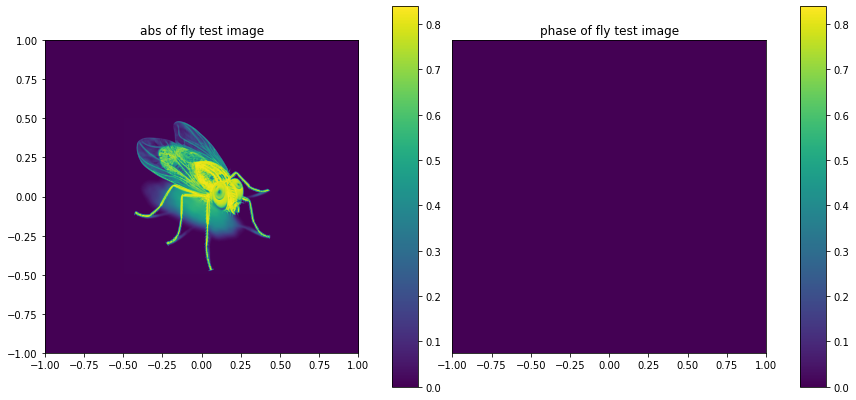

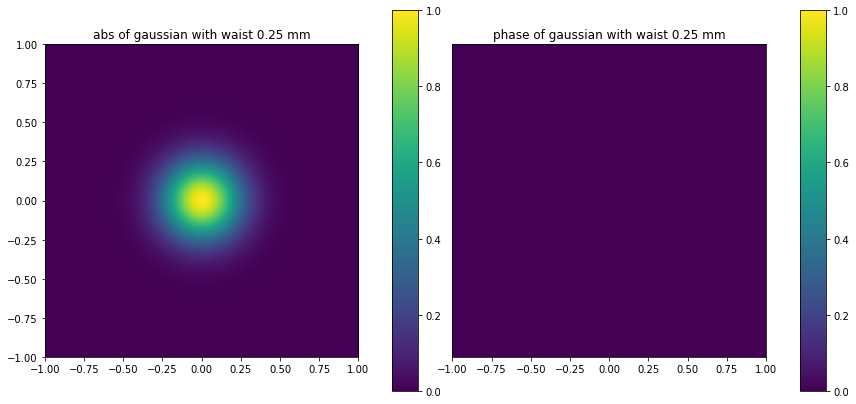

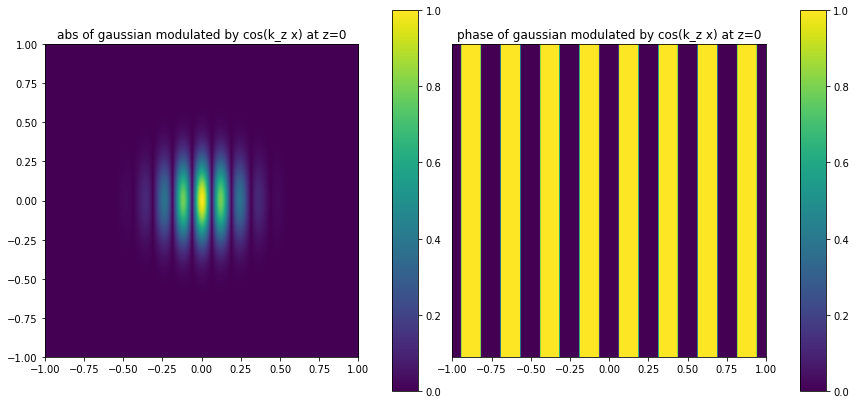

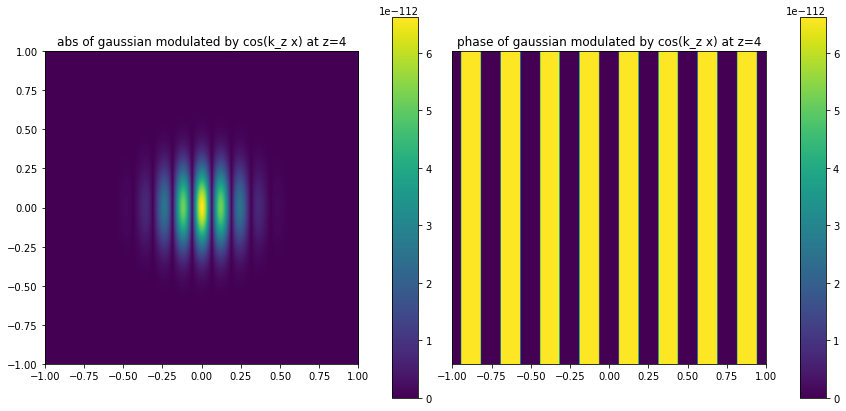

In [5]:
u_0_fly = get_fly_test_image('fly.png', Constants.N)
u_0_gauss = get_gaussian_field(Constants.w_0, coord)
u_0_cosine_z0 = get_gaussian_cos_field(Constants.w_0, Constants.k_s, 0.0, coord)
u_0_cosine_z4 = get_gaussian_cos_field( Constants.w_0, Constants.k_s, 4.0, coord)

plot_2d(u_0_fly, coord, title='fly test image')
plot_2d(u_0_gauss, coord, title=f'gaussian with waist {Constants.w_0} mm')
plot_2d(u_0_cosine_z0, coord, title=f'gaussian modulated by cos(k_z x) at z=0')
plot_2d(u_0_cosine_z4, coord, title=f'gaussian modulated by cos(k_z x) at z=4')

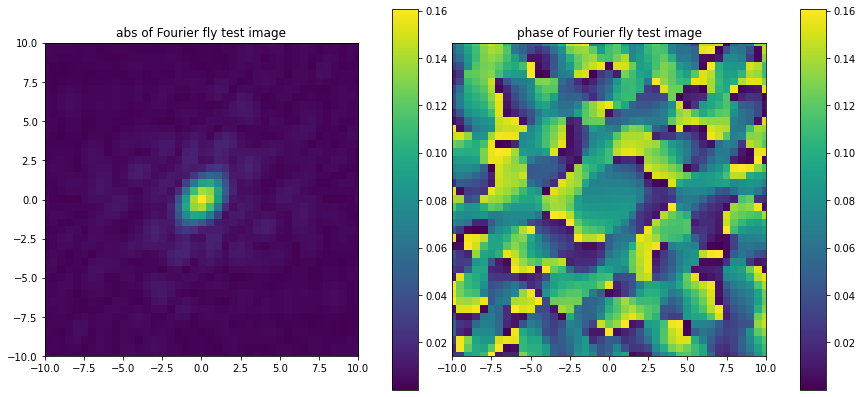

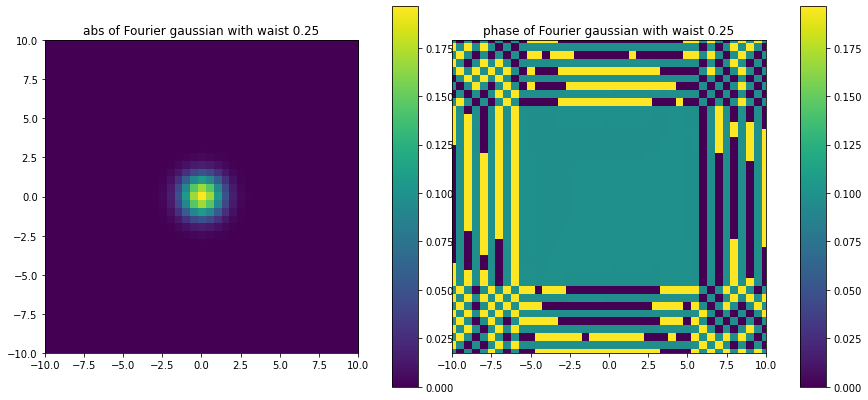

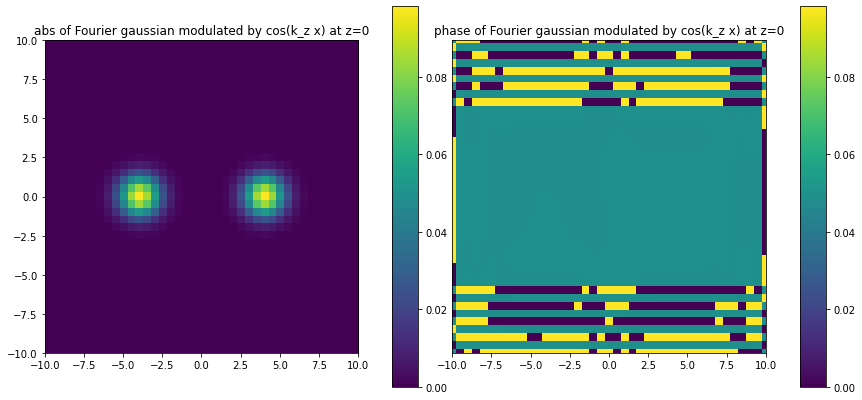

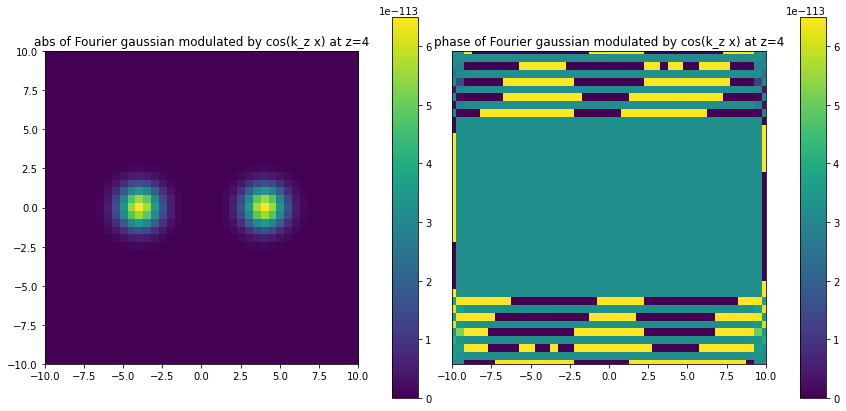

In [6]:
u_0_fly_fft = FFT2(u_0_fly, coord.dx)
u_0_gauss_fft = FFT2(u_0_gauss, coord.dx)
u_0_cosine_z0_fft = FFT2(u_0_cosine_z0, coord.dx)
u_0_cosine_z4_fft = FFT2(u_0_cosine_z4, coord.dx)

plot_2d(u_0_fly_fft, coord, fourier_space=True, zoom=10, title='Fourier fly test image')
plot_2d(u_0_gauss_fft, coord, fourier_space=True, zoom=10, title=f'Fourier gaussian with waist {Constants.w_0}')
plot_2d(u_0_cosine_z0_fft, coord, fourier_space=True, zoom=10, title=f'Fourier gaussian modulated by cos(k_z x) at z=0')
plot_2d(u_0_cosine_z4_fft, coord, fourier_space=True, zoom=10, title=f'Fourier gaussian modulated by cos(k_z x) at z=4')

# Propagation through free space

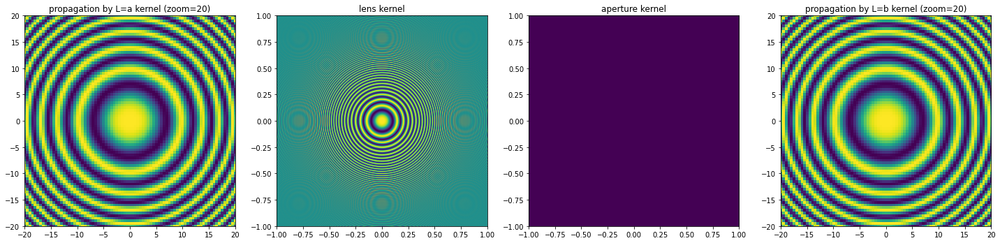

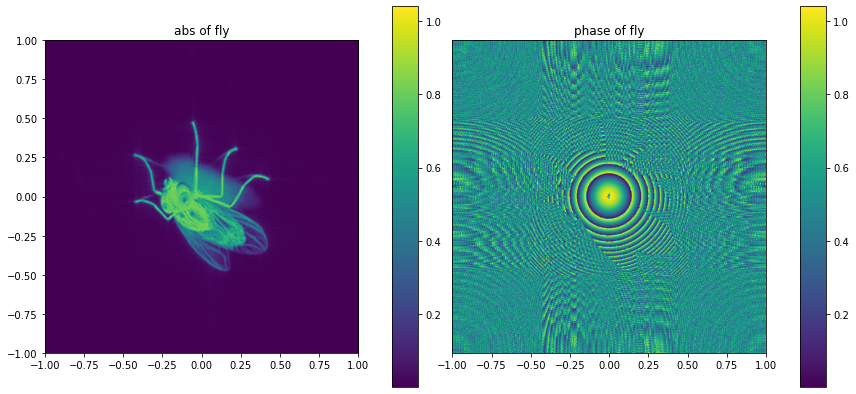

In [14]:
a = 20
b = 20
f = 10
D = None

system = SpaceLensSpaceSystem(a, b, f, D, Constants.k_z, coord)
system.plot_kernels(zoom=20)
u_f_fly = system.propagate(u_0_fly)
plot_2d(u_f_fly, coord, title='fly')

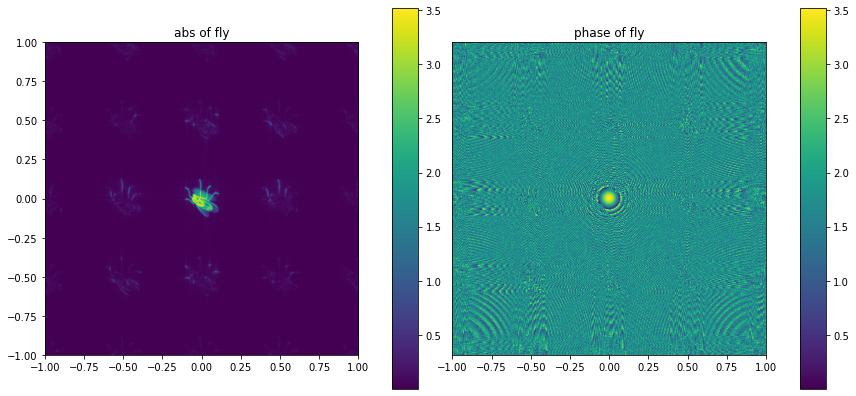

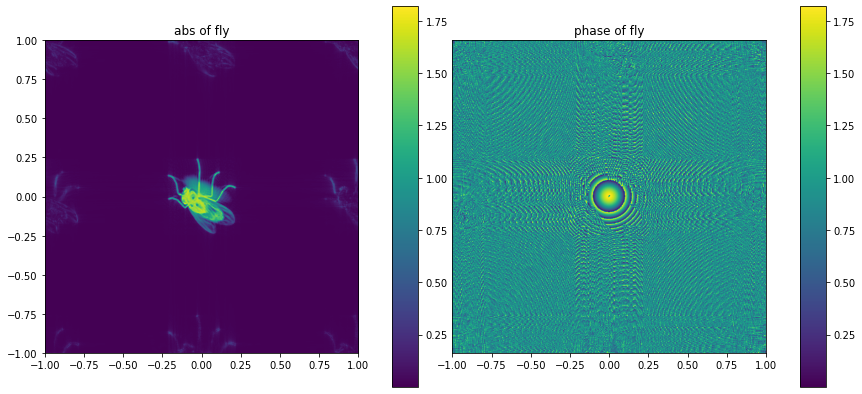

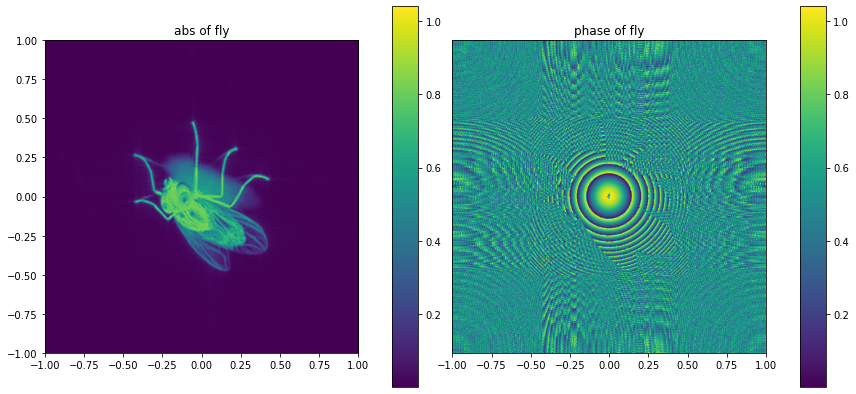

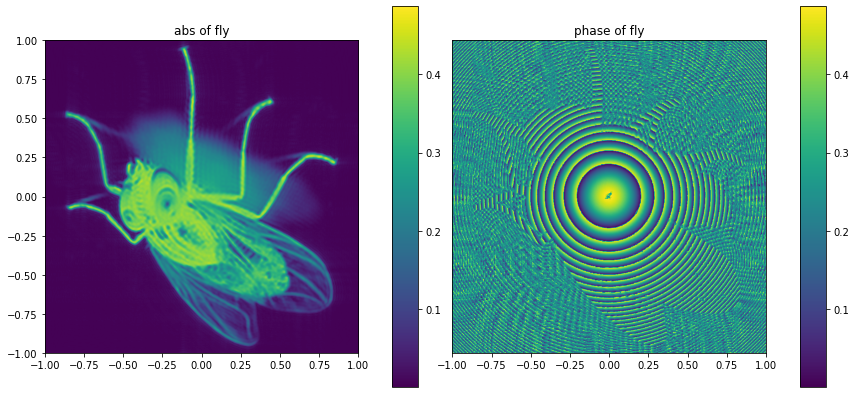

In [15]:
D = None
f = 10
for M in [-0.25, -0.5, -1, -2]:
    b = f * (1-M)
    a = f * (M-1)/M
    system = SpaceLensSpaceSystem(a, b, f, D, Constants.k_z, coord) 
    u_f_fly = system.propagate(u_0_fly)
    plot_2d(u_f_fly, coord, title='fly')

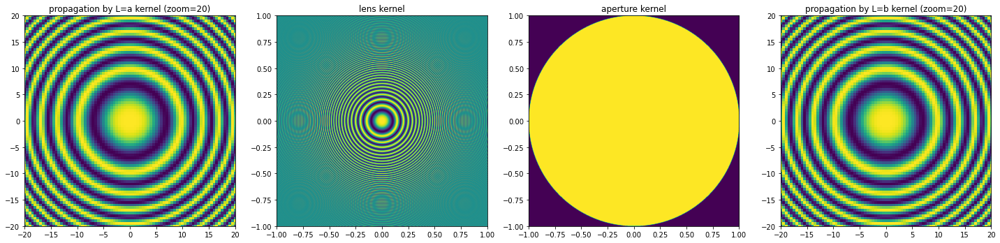

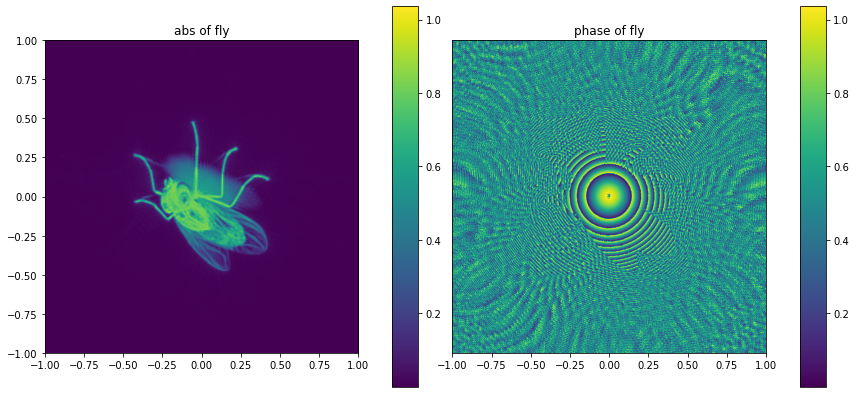

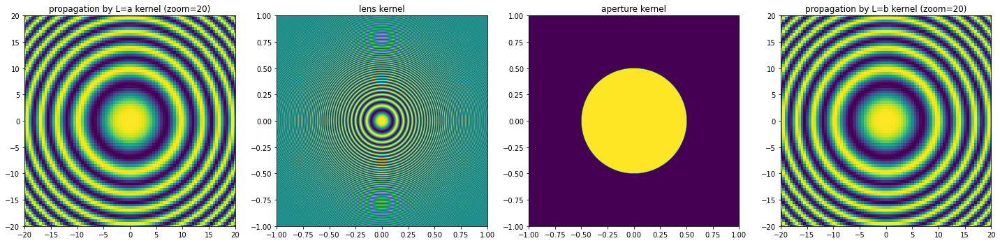

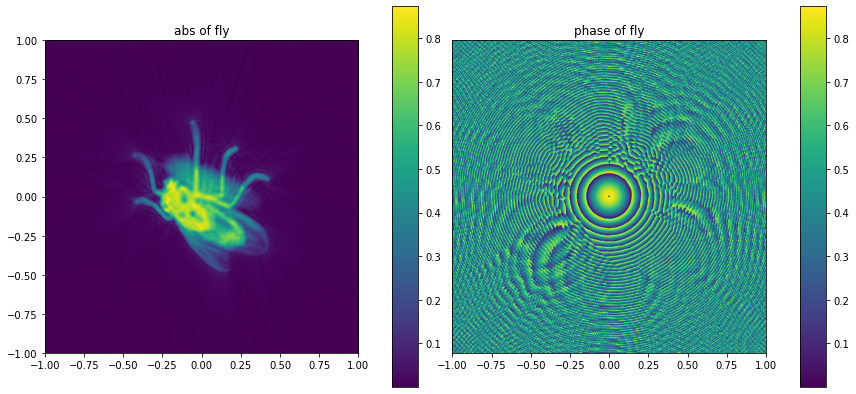

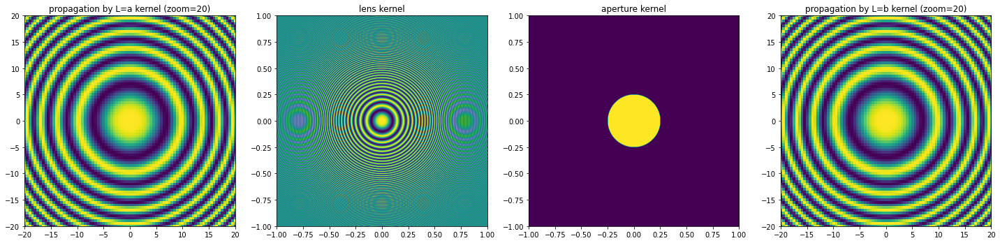

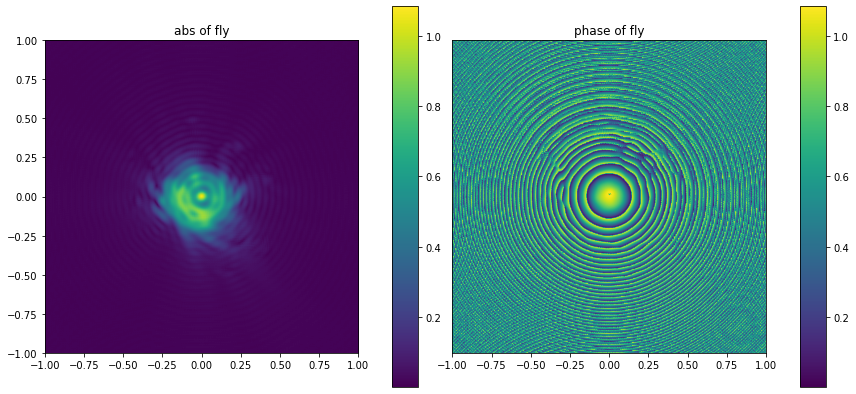

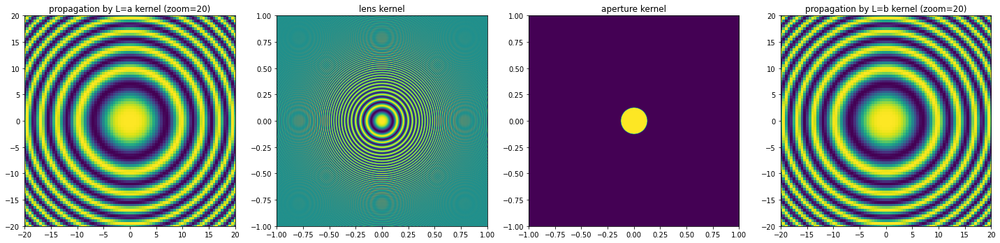

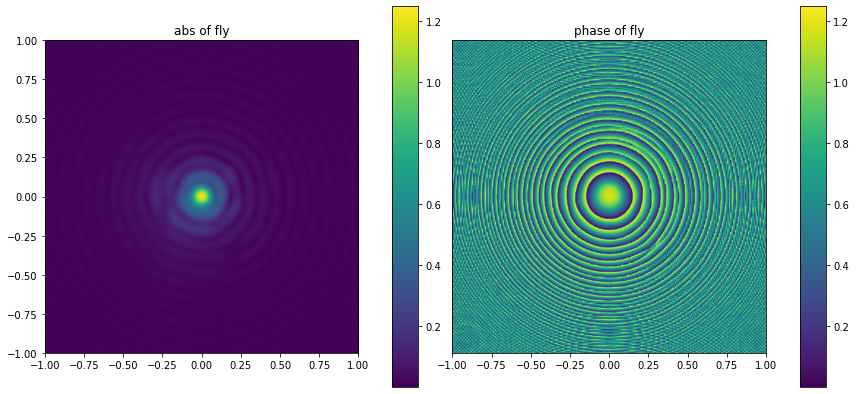

In [18]:
a = 20
b = 20
f = 10
for D in [2, 1, 0.5, 0.25]:
    system = SpaceLensSpaceSystem(a, b, f, D, Constants.k_z, coord) 
    system.plot_kernels(zoom=20)
    u_f_fly = system.propagate(u_0_fly)
    plot_2d(u_f_fly, coord, title='fly')

Delta = 0.000


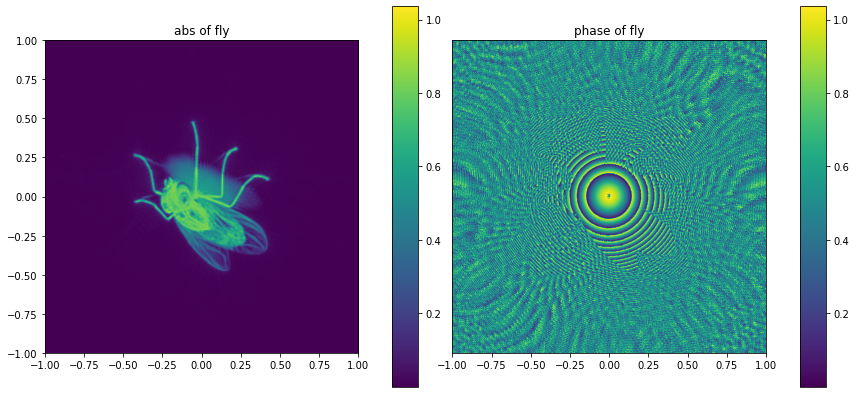

Delta = -0.010


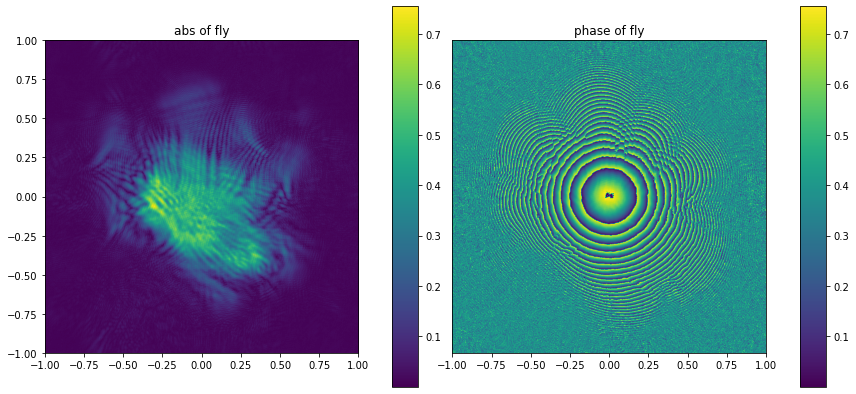

Delta = -0.021


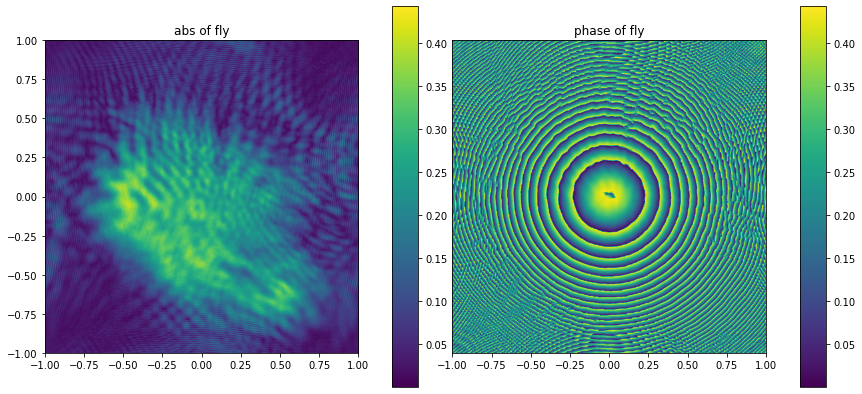

Delta = -0.025


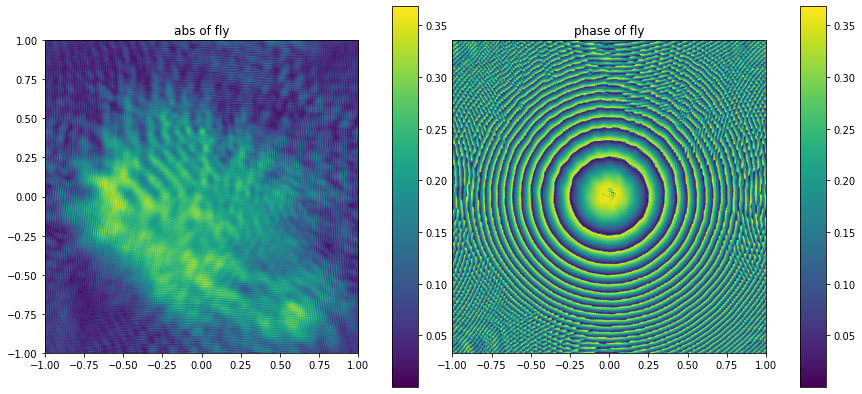

Delta = 0.000


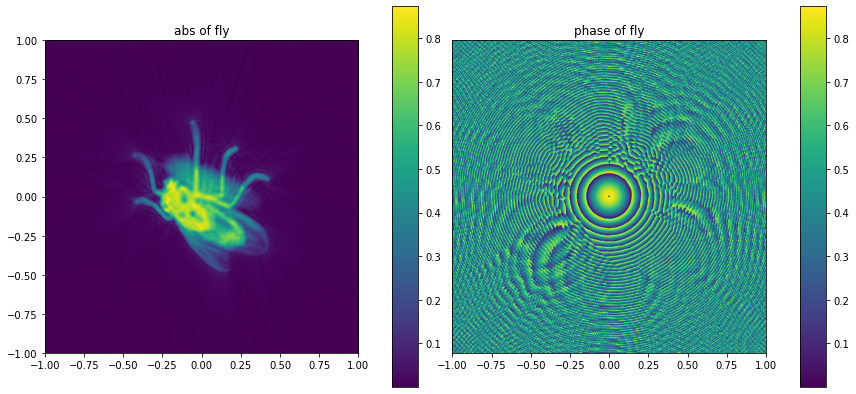

Delta = -0.010


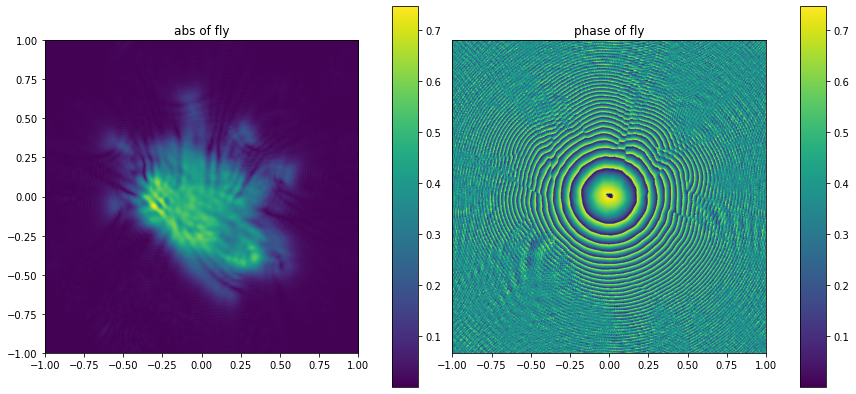

Delta = -0.021


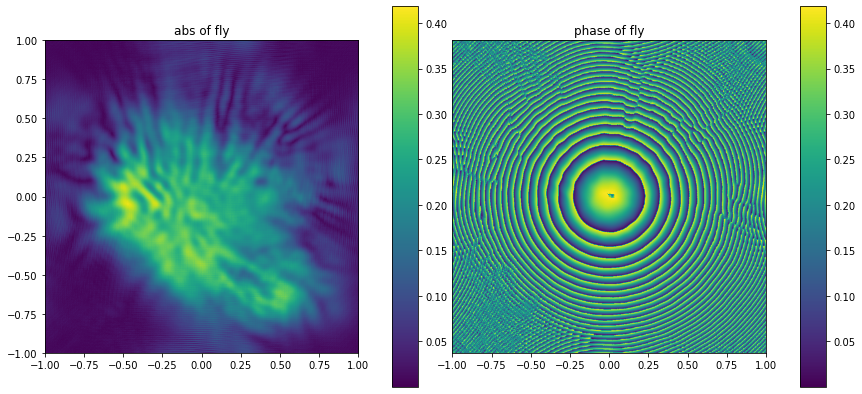

Delta = -0.025


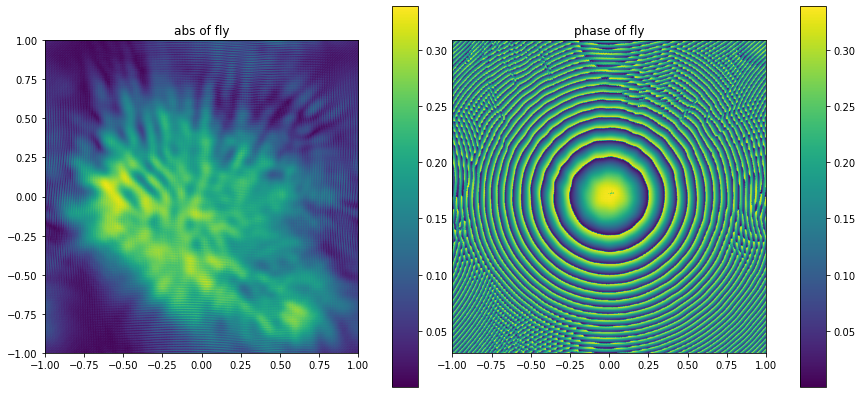

Delta = 0.000


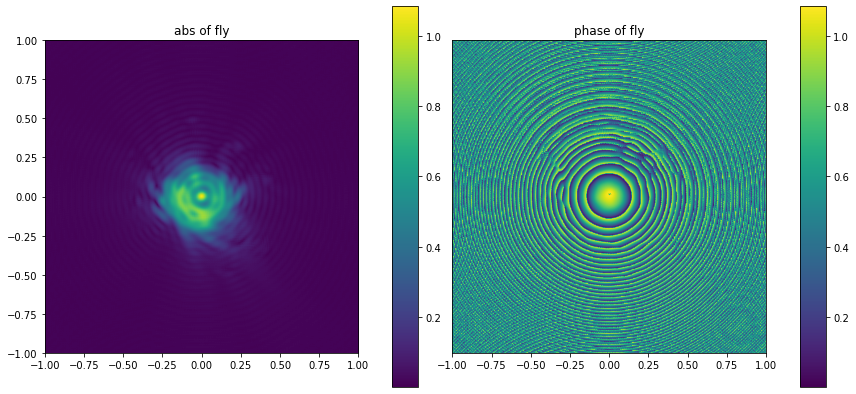

Delta = -0.010


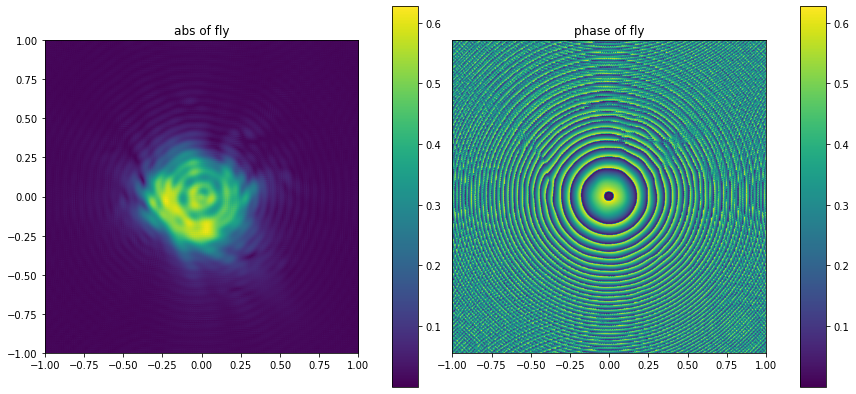

Delta = -0.021


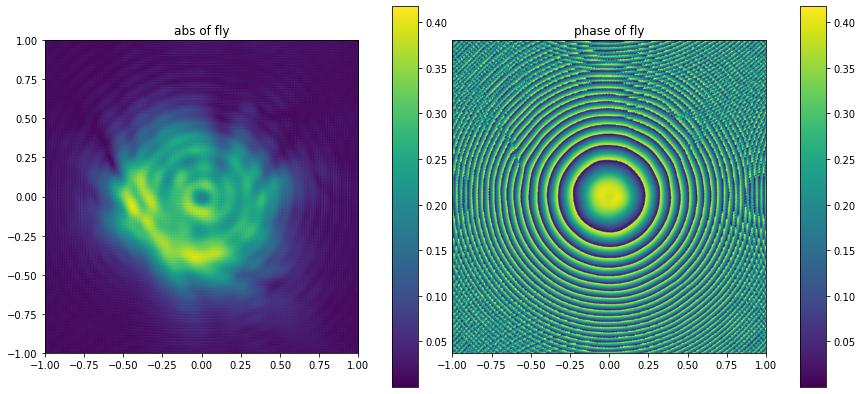

Delta = -0.025


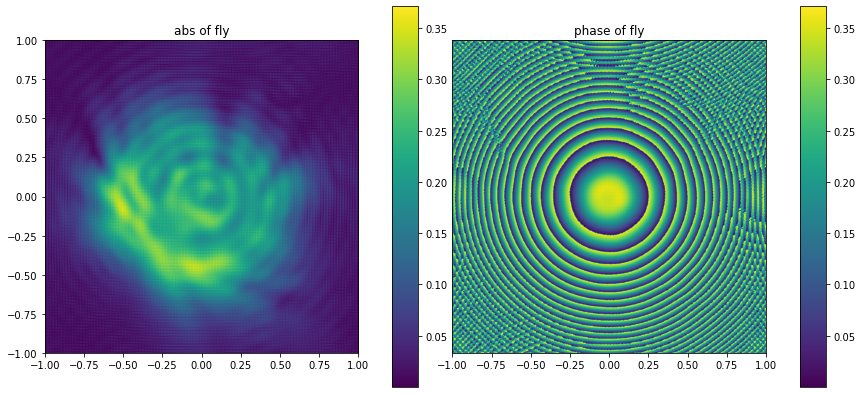

Delta = 0.000


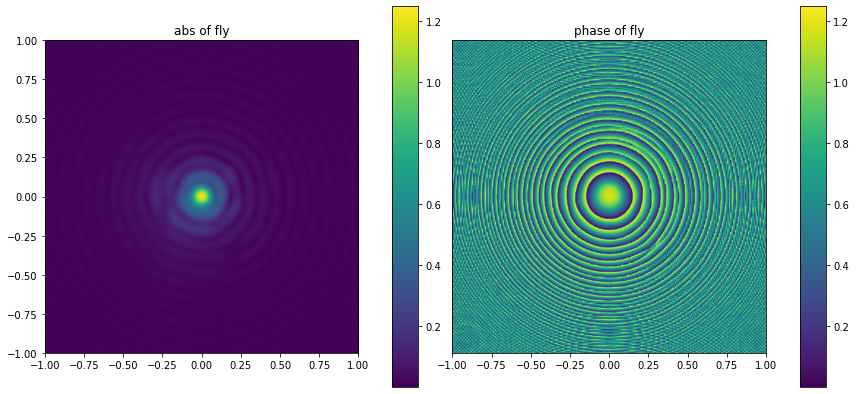

Delta = -0.010


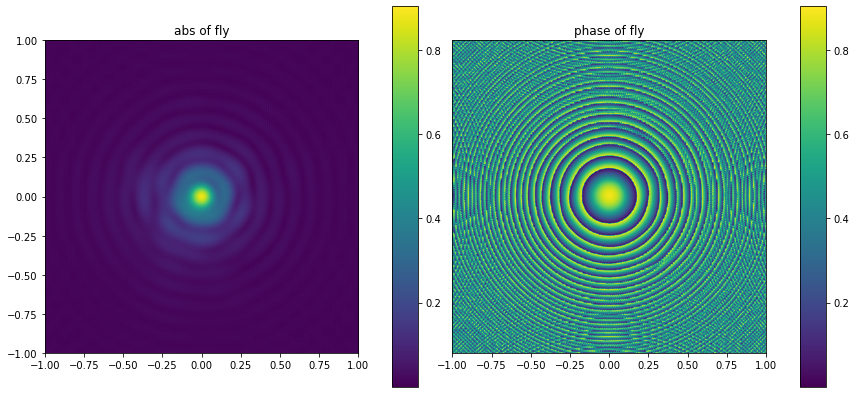

Delta = -0.021


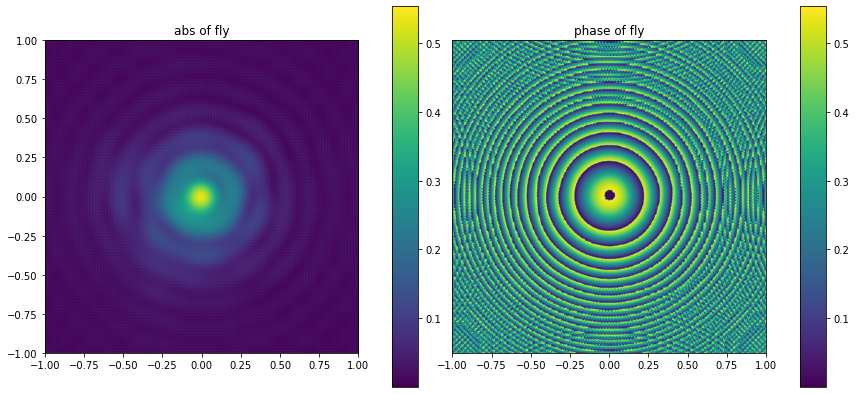

Delta = -0.025


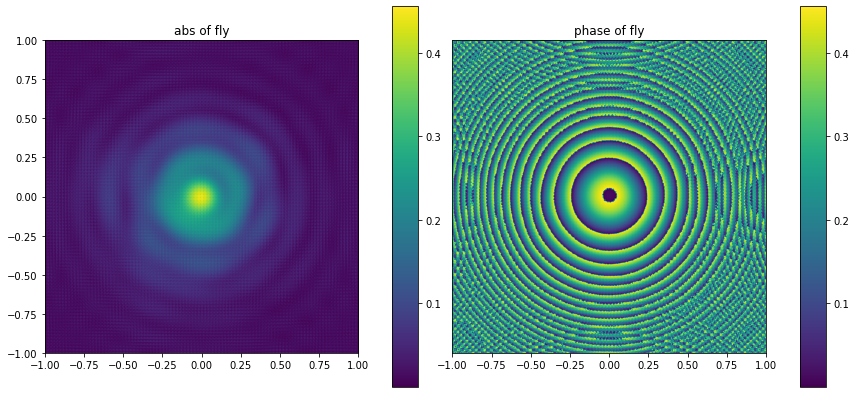

In [20]:
a = 20
f = 10

for D in [2, 1, 0.5, 0.25]:
    for b in [20, 25, 35, 40]:
        print(f'Delta = {1/20 + 1/b - 1/10:.3f}')
        system = SpaceLensSpaceSystem(a, b, f, D, Constants.k_z, coord) 
        u_f_fly = system.propagate(u_0_fly)
        plot_2d(u_f_fly, coord, title='fly')